This notebook computes the average SNR a given Voice Dataset. If the SNR is too low, that might reduce the performance or prevent model to learn. SNR paper can be seen here: https://www.cs.cmu.edu/~robust/Papers/KimSternIS08.pdf

To use this notebook, you need:
- WADA SNR estimation: http://www.cs.cmu.edu/~robust/archive/algorithms/WADA_SNR_IS_2008/
    1. extract in the same folder as this notebook
    2. under MacOS you'll have to rebuild the executable. In the build folder: 1) remove existing .o files and 2) run make


- FFMPEG: ```sudo apt-get install ffmpeg ```     


In [1]:
import os
import glob
import subprocess
import IPython
import soundfile as sf
import numpy as np
from tqdm import tqdm
from multiprocessing import Pool
from matplotlib import pylab as plt
%matplotlib inline

In [6]:
# Set the meta parameters
DATA_PATH = "/mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs"
NUM_PROC = 16
CURRENT_PATH = os.getcwd()

In [3]:
def compute_file_snr(file_path):
    """ Convert given file to required format with FFMPEG and process with WADA."""
    _, sr = sf.read(file_path)
    new_file = file_path.replace(".wav", "_tmp.wav")
    if sr != 16000:
        command = f'ffmpeg -i "{file_path}" -ac 1 -acodec pcm_s16le -y -ar 16000 "{new_file}"'
    else:
        command = f'cp "{file_path}" "{new_file}"'
    os.system(command)
    command = [f'"{CURRENT_PATH}/WadaSNR/Exe/WADASNR"', f'-i "{new_file}"', f'-t "{CURRENT_PATH}/WadaSNR/Exe/Alpha0.400000.txt"', '-ifmt mswav']
    output = subprocess.check_output(" ".join(command), shell=True)
    try:
        output = float(output.split()[-3].decode("utf-8"))
    except:
        raise RuntimeError(" ".join(command))
    os.system(f'rm "{new_file}"')
    return output, file_path


In [4]:
wav_file = "/home/erogol/Data/LJSpeech-1.1/wavs/LJ001-0001.wav"
output = compute_file_snr(wav_file)

RuntimeError: Error opening '/home/erogol/Data/LJSpeech-1.1/wavs/LJ001-0001.wav': System error.

In [7]:
wav_files = glob.glob(f"{DATA_PATH}/**/*.wav", recursive=True)
print(f" > Number of wav files {len(wav_files)}")

 > Number of wav files 28414


In [8]:
if NUM_PROC == 1:
    file_snrs = [None] * len(wav_files) 
    for idx, wav_file in tqdm(enumerate(wav_files)):
        tup = compute_file_snr(wav_file)
        file_snrs[idx] = tup
else:
    with Pool(NUM_PROC) as pool:
        file_snrs = list(tqdm(pool.imap(compute_file_snr, wav_files), total=len(wav_files)))

100%|██████████| 28414/28414 [01:25<00:00, 330.69it/s]


In [9]:
snrs = [tup[0] for tup in file_snrs]

error_idxs = np.where(np.isnan(snrs) == True)[0]
error_files = [wav_files[idx] for idx in error_idxs]

file_snrs = [i for j, i in enumerate(file_snrs) if j not in error_idxs]
file_names = [tup[1] for tup in file_snrs]
snrs = [tup[0] for tup in file_snrs]
file_idxs = np.argsort(snrs)


print(f" > Average SNR of the dataset:{np.mean(snrs)}")

 > Average SNR of the dataset:34.61760471849479


In [10]:
def output_snr_with_audio(idx):
    file_idx = file_idxs[idx]
    file_name = file_names[file_idx]
    wav, sr = sf.read(file_name)
    # multi channel to single channel
    if len(wav.shape) == 2:
        wav = wav[:, 0]
    print(f" > {file_name} - snr:{snrs[file_idx]}")
    IPython.display.display(IPython.display.Audio(wav, rate=sr))

In [11]:
# find worse SNR files
N = 100  # number of files to fetch
for i in range(N):
    output_snr_with_audio(i)

 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd2_496.wav - snr:-20.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd2_496.wav - snr:-20.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-65.wav - snr:-2.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ddm_rnd2_130.wav - snr:0.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-69.wav - snr:5.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-02-31.wav - snr:5.591046


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/cau_rnd2_363.wav - snr:6.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-7.wav - snr:6.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd2_046.wav - snr:7.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_434.wav - snr:7.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd2_046.wav - snr:7.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd1_096.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-01-26.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_289.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_449.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-1.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-44.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd1_096.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-63.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd3_213.wav - snr:8.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd1_362.wav - snr:8.283062


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_ivan_249.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd3_449.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ddm_rnd2_328.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_429.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_184.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd3_449.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_260.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_333.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-02-9.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_333.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_077.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_492.wav - snr:9.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-02-2.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_267.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_211.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/eme_rnd2_382.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_167.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_277.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-26.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_425.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_399.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_382.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_195.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_204.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_255.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_289.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_406.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_500.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_492.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd2_382.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_479.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_492.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/fds_rnd1_117.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_192.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_206.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_213.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_273.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/pss_rnd2_449.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/pss_rnd2_363.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_141.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-01-24.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_084.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-02-18.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/cau_rnd1_324.wav - snr:10.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd1_364.wav - snr:10.085988


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_310.wav - snr:10.911766


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/delia_andra_interviu-03-2.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ddm_rnd2_211.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_408.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_243.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ddm_rnd2_077.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_SUS_013.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_428.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/htm_rnd2_130.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_082.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_150.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/cau_rnd1_347.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_333.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_130.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_096.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_068.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/ele_rnd3_213.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_331.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_424.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_363.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_489.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_408.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_385.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/sds_rnd1_108.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/fds_rnd1_058.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_347.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/cau_rnd2_425.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd2_486.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_195.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd1_164.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/cau_rnd1_164.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_diph1_097.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/adr_stan_292.wav - snr:11.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/bas_rnd3_032.wav - snr:11.0


In [13]:
# find best recordings
N = 10  # number of files to fetch
for i in range(N):
    output_snr_with_audio(-i-1)

 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_47_00108.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_67_00008.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_67_00005.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00104.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00103.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00102.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00095.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00093.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00091.wav - snr:100.0


 > /mnt/FastData/dl_workspace/ws_other/voxbox/datasets/resampled/ds_v2/wavs/mara_66_00088.wav - snr:100.0


(array([2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 3.000e+00, 0.000e+00, 2.000e+00,
        5.000e+00, 4.400e+01, 4.600e+01, 6.800e+01, 9.300e+01, 1.490e+02,
        4.390e+02, 3.700e+02, 4.680e+02, 5.690e+02, 5.920e+02, 1.406e+03,
        8.370e+02, 8.540e+02, 8.520e+02, 8.890e+02, 1.621e+03, 9.000e+02,
        7.600e+02, 7.960e+02, 7.180e+02, 1.290e+03, 5.880e+02, 5.830e+02,
        5.450e+02, 5.150e+02, 9.130e+02, 3.920e+02, 3.450e+02, 3.500e+02,
        3.500e+02, 5.740e+02, 2.470e+02, 2.370e+02, 2.150e+02, 2.230e+02,
        3.460e+02, 1.600e+02, 1.860e+02, 1.310e+02, 1.520e+02, 2.770e+02,
        1.110e+02, 9.400e+01, 1.030e+02, 9.900e+01, 1.740e+02, 8.500e+01,
        7.500e+01, 6.800e+01, 7.000e+01, 1.190e+02, 6.900e+01, 4.500e+01,
        6.500e+01, 5.600e+01, 9.100e+0

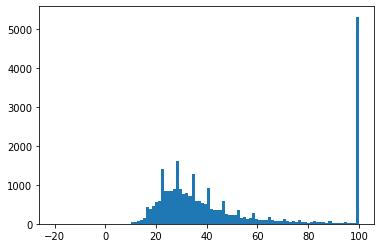

In [14]:
plt.hist(snrs, bins=100)

In [12]:
sorted_files = np.array(file_names)[file_idxs]
sorted_snrs = np.array(snrs)[file_idxs]

In [13]:
sorted_names = [path.split('/')[-1] for path in sorted_files]
sorted_names = [name.split('_')[0] for name in sorted_names]

In [14]:
sorted_names

['eme',
 'ele',
 'delia',
 'ddm',
 'delia',
 'delia',
 'cau',
 'delia',
 'ele',
 'bas',
 'eme',
 'ele',
 'delia',
 'adr',
 'bas',
 'delia',
 'delia',
 'eme',
 'delia',
 'eme',
 'htm',
 'adr',
 'eme',
 'ddm',
 'bas',
 'bas',
 'ele',
 'bas',
 'bas',
 'delia',
 'htm',
 'bas',
 'bas',
 'delia',
 'bas',
 'htm',
 'eme',
 'bas',
 'bas',
 'delia',
 'htm',
 'bas',
 'htm',
 'adr',
 'bas',
 'bas',
 'bas',
 'adr',
 'bas',
 'bas',
 'ele',
 'bas',
 'bas',
 'fds',
 'bas',
 'bas',
 'bas',
 'bas',
 'pss',
 'pss',
 'bas',
 'delia',
 'bas',
 'delia',
 'cau',
 'ele',
 'htm',
 'delia',
 'ddm',
 'bas',
 'bas',
 'ddm',
 'adr',
 'bas',
 'htm',
 'adr',
 'bas',
 'cau',
 'adr',
 'bas',
 'bas',
 'bas',
 'ele',
 'bas',
 'bas',
 'bas',
 'adr',
 'bas',
 'adr',
 'sds',
 'fds',
 'bas',
 'cau',
 'bas',
 'bas',
 'bas',
 'cau',
 'adr',
 'adr',
 'bas',
 'bas',
 'htm',
 'eme',
 'bas',
 'htm',
 'ddm',
 'bas',
 'ele',
 'bas',
 'ele',
 'bas',
 'delia',
 'bas',
 'bas',
 'sds',
 'eme',
 'bas',
 'eme',
 'delia',
 'ele',
 'ele',


In [15]:
from collections import defaultdict
snr_dict = defaultdict(list)
name_map = {"adr": "sam", "eme": "ele", "delia": "dla"}
[snr_dict[name_map.get(name, name)].append(snr) for name, snr in zip(sorted_names, sorted_snrs)]

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [16]:
for key, values in snr_dict.items():
    print(key)
    print('count:', len(values))
    print('mean:', np.mean(values))
    print('std:', np.std(values))
    print('quantiles:',
        f'0.0: {np.quantile(values, 0.0):.2f}', 
        f'| 0.05: {np.quantile(values, 0.05):.2f}',
        f'| 0.25: {np.quantile(values, 0.25):.2f}', 
        f'| 0.5: {np.quantile(values, 0.5):.2f}', 
        f'| 0.75: {np.quantile(values, 0.75):.2f}', 
        f'| 0.95: {np.quantile(values, 0.95):.2f}', 
        f'| 1.0: {np.quantile(values, 1.0):.2f}'
    )
    print()

ele
count: 2986
mean: 33.64882318653717
std: 13.81139207465452
quantiles: 0.0: -20.00 | 0.05: 19.00 | 0.25: 26.00 | 0.5: 31.00 | 0.75: 38.00 | 0.95: 57.00 | 1.0: 100.00

dla
count: 187
mean: 24.607771625668448
std: 18.356051514247497
quantiles: 0.0: -2.00 | 0.05: 10.00 | 0.25: 15.00 | 0.5: 19.02 | 0.75: 26.40 | 0.95: 53.70 | 1.0: 100.00

ddm
count: 996
mean: 27.873944247991968
std: 13.237722083289787
quantiles: 0.0: 0.00 | 0.05: 15.00 | 0.25: 20.91 | 0.5: 25.00 | 0.75: 31.00 | 0.95: 48.98 | 1.0: 100.00

cau
count: 996
mean: 27.967903883534134
std: 10.803813774338673
quantiles: 0.0: 6.00 | 0.05: 17.00 | 0.25: 22.00 | 0.5: 26.00 | 0.75: 31.23 | 0.95: 44.00 | 1.0: 100.00

bas
count: 1490
mean: 21.790843273825505
std: 8.592492987407317
quantiles: 0.0: 7.00 | 0.05: 12.00 | 0.25: 17.00 | 0.5: 20.00 | 0.75: 25.00 | 0.95: 34.00 | 1.0: 100.00

sam
count: 5205
mean: 23.884981888760805
std: 6.389471741676131
quantiles: 0.0: 8.00 | 0.05: 16.00 | 0.25: 20.00 | 0.5: 23.00 | 0.75: 27.00 | 0.95: 35.00

In [17]:
np.save('/mnt/FastData/dl_workspace/ws_other/voxbox/datasets/statistics/ds_snr.npy', list(zip(sorted_files, sorted_snrs)))